In [33]:
import numpy as np
from numpy import linalg as la
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
np.set_printoptions(precision=5, suppress=True)
import pandas as pd
import numpy as np
import re
import sklearn
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

import warnings
warnings.filterwarnings('ignore')

# Going to use these 5 base models for the stacking
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.svm import SVC
from sklearn.cross_validation import KFold
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
from plotly import tools

# import cufflinks and offline mode
import cufflinks as cf
cf.go_offline()

/Users/gaoziyao/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/gaoziyao/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/gaoziyao/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/gaoziyao/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/gaoziyao/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


# Read data and some ETA

In [2]:
raw_data = pd.read_table('Desktop/DS/SVD/data_all_mean_time_2.txt',sep='\t', header=0)
raw_data.tail()


,city_id,driver_id,m1,m2,m3,m4,m5,m6,m7,m8,...,m135,m136,m137,m138,m139,m140,m141,m142,m143,m144
814788,85,580542342099522,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
814789,85,580542342207158,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
814790,85,580542342293914,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
814791,85,580542342314864,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
814792,85,580542342930548,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
print(raw_data.shape)

(814793, 146)


In [4]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 814793 entries, 0 to 814792
Columns: 146 entries, city_id to m144
dtypes: float64(144), int64(2)
memory usage: 907.6 MB


In [5]:
# calculate total online time for each driver
total_online_time = raw_data.iloc[:, 2:].T.apply(sum)

In [6]:
# calculate total online hours for two peak time period
morning_rushhour_online_time = raw_data.iloc[:, 43:62].T.apply(sum) # 07：00~09：59
non_peak_online_time = raw_data.iloc[:,63:104].T.apply(sum) #0：00~16：59
evening_rushhour_online_time = raw_data.iloc[:,105:128].T.apply(sum) 

In [7]:
# combine all the stats into a datafram
df = pd.DataFrame({'total_online_time': total_online_time,
                  'morning_rushhour_online_time': morning_rushhour_online_time,
                  'non_peak_online_time': non_peak_online_time,
                  'evening_rushhour_online_time': evening_rushhour_online_time})

In [8]:
df.head()

,total_online_time,morning_rushhour_online_time,non_peak_online_time,evening_rushhour_online_time
0,3.800,3.20,0.00,0.00
1,18.000,9.10,0.00,8.80
2,10.020,3.58,4.36,1.64
3,8.300,0.00,8.30,0.00
4,7.775,0.00,1.55,1.35


In [9]:
# check the max hour 
df.total_online_time.max()

142.68571428571423

In [10]:
# do some stats
df.describe()

,total_online_time,morning_rushhour_online_time,non_peak_online_time,evening_rushhour_online_time
count,814793.000000,814793.000000,814793.000000,814793.000000
mean,27.703565,4.358566,10.317713,6.675803
std,22.512566,5.235595,10.795674,6.386499
min,0.100000,0.000000,0.000000,0.000000
25%,7.733333,0.000000,0.450000,0.400000
50%,23.033333,1.800000,6.383333,5.071429
75%,44.214286,8.100000,18.300000,11.640000
max,142.685714,19.000000,41.000000,23.000000


In [11]:
# merge the stats with raw data
total = pd.concat([raw_data, df], axis=1)

In [12]:
# tease out part-time driver
part_time = total[total['total_online_time']<6]

In [13]:
# slice beijing data for modeling
data_bj = total[total.city_id==1].groupby('driver_id').mean().reset_index()

In [14]:
data_bj.head()

,driver_id,city_id,m1,m2,m3,m4,m5,m6,m7,m8,...,m139,m140,m141,m142,m143,m144,total_online_time,morning_rushhour_online_time,non_peak_online_time,evening_rushhour_online_time
0,562950053795713,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.80,3.20,0.00,0.00
1,562950053809475,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,18.00,9.10,0.00,8.80
2,562950053855353,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,10.02,3.58,4.36,1.64
3,562950053857096,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.20,0.00,0.05,0.00
4,562950053862719,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,8.30,0.00,8.30,0.00


In [15]:
print(data_bj.shape)

(176883, 150)


# SVD 矩阵

In [16]:
# remove the last four statistic fields and two id columns
# then convert to matrix
x = data_bj.iloc[:, 2:-4].values

In [17]:
# convert the raw data to a SVD matrix
u, s, v = np.linalg.svd(x, full_matrices=False)

In [18]:
print(u.shape)
print(s.shape)
print(v.shape)

(176883, 144)
(144,)
(144, 144)


#### Explore how to divide drivers to different groups based on their U matrix value

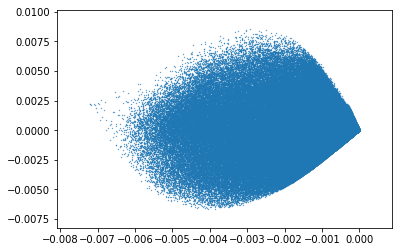

In [19]:
plt.scatter(u[:, 0], u[:, 1], s=0.1)
plt.show()

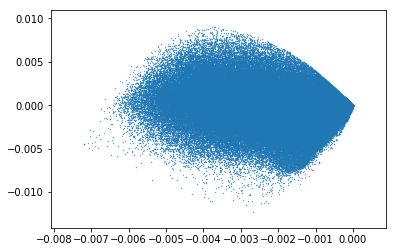

In [20]:
plt.scatter(u[:, 0], u[:, 2], s=0.1)
plt.show()

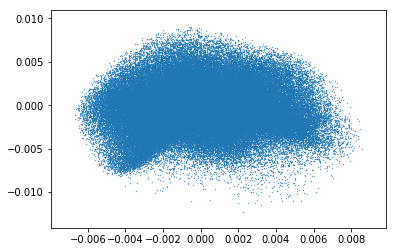

In [21]:
plt.scatter(u[:, 1], u[:, 2], s=0.1)
plt.show()

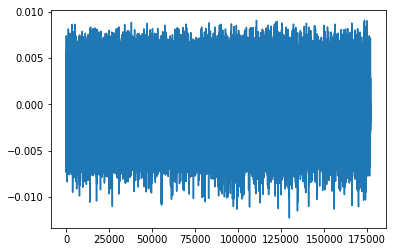

In [22]:
# 查看司机在方差均值上的波动,单个司机个体差异还是较大的
plt.plot(u[:, 2], label='u0')
plt.show()

In [23]:
# SVD分组结果
# 构建一个176883行的空集
group = x.mean(axis=1)*0
group

array([0., 0., 0., ..., 0., 0., 0.])

In [24]:
print(group.shape)

(176883,)


In [31]:
# 根据第一列和第三列的交叉将所有数据切为四个象限
# xx = (u[:, 0]>np.mean(u[:,0])) & (u[:,2]>np.mean(u[:,2]))
# xx.shape
group[(u[:, 0]>np.mean(u[:, 0])) & (u[:, 2]>np.mean(u[:,2]))]=0
group[(u[:, 0]>np.mean(u[:, 0])) & (u[:, 2]<=np.mean(u[:,2]))]=1
group[(u[:, 0]<=np.mean(u[:, 0])) & (u[:, 2]<=np.mean(u[:,2]))]=2
group[(u[:, 0]<=np.mean(u[:, 0])) & (u[:, 2]>np.mean(u[:,2]))]=3

In [32]:
# group drivers by the group derived from U matrix
idgrp = pd.concat([data_bj.driver_id, pd.Series(group)], axis=1)
idgrp.columns = ['driver_id', 'group_id']
idgrp.head()

,driver_id,group_id
0,562950053795713,1.0
1,562950053809475,1.0
2,562950053855353,1.0
3,562950053857096,0.0
4,562950053862719,0.0


In [34]:
# some EDA
def donut_chart(df, feature):
    temp = df[feature].value_counts()
    df = pd.DataFrame({'labels': temp.index.sort_values(ascending=True),
                      'values': temp.values
                      })
    df.iplot(kind='pie', labels='labels', values='values', title='drivers by group', hole=0.7)

In [35]:
donut_chart(idgrp, 'group_id')

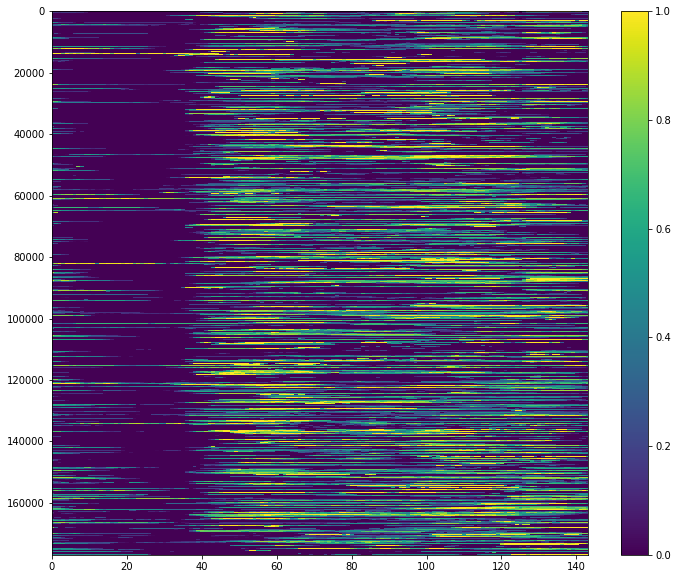

In [37]:
# plot raw data as baseline for comparison
plt.figure(figsize=(12,10))
plt.imshow(x[:, :], aspect='auto')
plt.xlim(0,143)
plt.colorbar()
plt.show()

In [46]:
# 可以将相同类的id通过sorting排在一起，但是为什么是add back u[:, 2]??
idx3 = np.argsort(group + u[:, 2])
idx3

array([167172, 168770,  83817, ..., 174843, 110606, 173359])

In [48]:
group_nums = idgrp.groupby('group_id').count().reset_index().cumsum()
group_nums

,group_id,driver_id
0,0.0,51532.0
1,1.0,99808.0
2,3.0,133656.0
3,6.0,176883.0


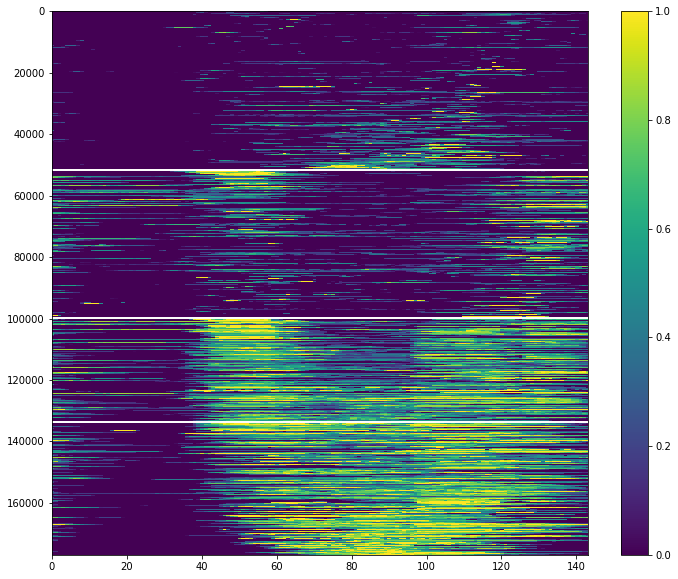

In [50]:
# plot the groupped driver
plt.figure(figsize=(12,10))
plt.imshow(x[idx3, :], aspect='auto')
plt.hlines(y=int(group_nums['driver_id'][0]) - 1, xmin=0, xmax=144, color='white')
plt.hlines(y=int(group_nums['driver_id'][0]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][0])+1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]+1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]+1), xmin=0, xmax=144,color='white')
plt.xlim(0,143)
plt.colorbar()
plt.show()

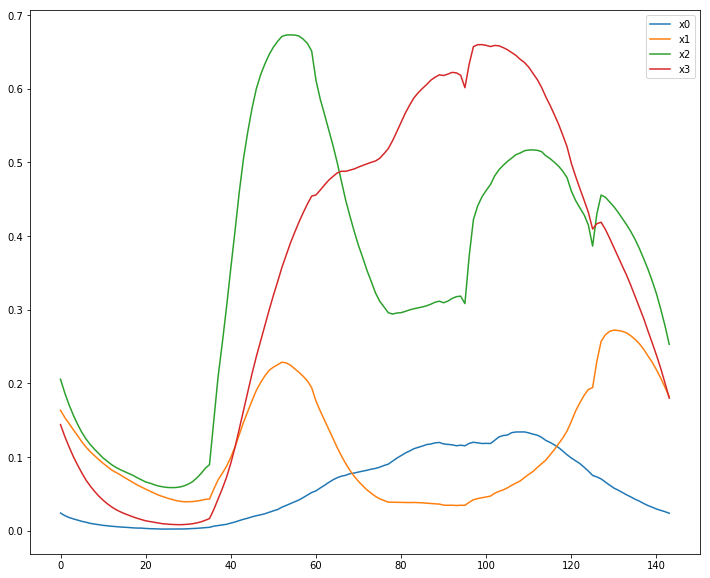

In [51]:
x0 = x[group==0, :].mean(axis=0)
x1 = x[group==1, :].mean(axis=0)
x2 = x[group==2, :].mean(axis=0)
x3 = x[group==3, :].mean(axis=0)
plt.figure(figsize=(12,10))
# plt.style.use('fivethirtyeight')
plt.subplot(111)
plt.plot(x0[:144], label='x0')
plt.plot(x1[:144], label='x1')
plt.plot(x2[:144], label='x2')
plt.plot(x3[:144], label='x3')
plt.legend()
plt.show()

In [63]:
# SVD矩阵相关性和kmeans聚类
# 计算s特征矩阵中各特征值的平方和占比 -- 当我们进行SVD压缩数据时，信息量会有所丢失，所以根据这个计算结果我们可以看出多少个因子可以解释最初的原始矩阵X%的信息
t_square_total = 0
a = []
k = []
for i in range(len(s)):
    t = s[i]
    t_square = t*t
    t_square_total = t_square_total + t_square
    a.append(t_square_total)
    k.append(i)
(a/a[-1])[:10] # 计算前10个因子所能包含的信息量，后面的因子基本为噪音

array([0.63826, 0.75823, 0.81981, 0.85899, 0.88243, 0.89812, 0.91104,
       0.92052, 0.92838, 0.93402])

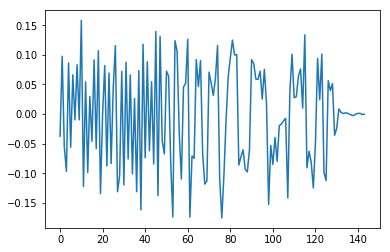

In [64]:
# v矩阵的每一列表示的是对应时间点下不同模式司机的波动表现
# 扰动越大代表解释的信息越多，因子也就越重要
plt.plot(v[:, 0], label='0')
plt.show()

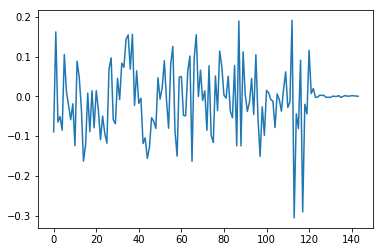

In [68]:
plt.plot(v[:, 130], label='0')
plt.show()

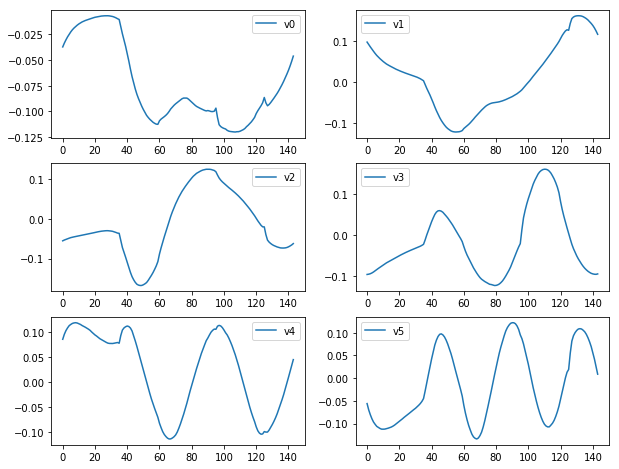

In [70]:
# 不同司机行为模式下的表现,  司机对于在线行为方向的聚类
# 只有前几行是有意义，最终的聚类到底用的是v矩阵
# 图形周期性越大，解释的信息量越小，这也侧面说明了前面的因子已经解释了足够多的信息
plt.figure(figsize=(10,8))
plt.subplot(3,2,1)
plt.plot(v[0, :], label='v0')
plt.legend()

plt.subplot(3,2,2)
plt.plot(v[1, :], label='v1')
plt.legend()

plt.subplot(3,2,3)
plt.plot(v[2, :], label='v2')
plt.legend()

plt.subplot(3,2,4)
plt.plot(v[3, :], label='v3')
plt.legend()

plt.subplot(3,2,5) ## 从图5开始图形出现信息周期波动，后面解释的信息量太少成为噪音
plt.plot(v[4, :], label='v4')
plt.legend()

plt.subplot(3,2,6)
plt.plot(v[5, :], label='v5')
plt.legend()

#### 计算每一个司机与v矩阵的前5个因子的correlation

In [80]:
v0 = v[0, :]
v1 = v[1, :]
v2 = v[2, :]
v3 = v[3, :]
v4 = v[4, :]

corr0 = []
corr1 = []
corr2 = []
corr3 = []
corr4 = []
for i in range(len(x)):
    corr0.append((np.corrcoef(x[i], v0))[0][1])
    corr1.append((np.corrcoef(x[i], v1))[0][1])
    corr2.append((np.corrcoef(x[i], v2))[0][1])
    corr3.append((np.corrcoef(x[i], v3))[0][1])
    corr4.append((np.corrcoef(x[i], v4))[0][1])

In [97]:
t = pd.concat([data_bj['driver_id'], 
               pd.Series(corr0, index=data_bj.index),
              pd.Series(corr1, index=data_bj.index),
              pd.Series(corr2, index=data_bj.index),
              pd.Series(corr3, index=data_bj.index),
              pd.Series(corr4, index=data_bj.index)], axis=1)
t.columns = ['driver_id', 'v0', 'v1', 'v2', 'v3', 'v4']
t.head()

,driver_id,v0,v1,v2,v3,v4
0,562950053795713,-0.149342,-0.267154,-0.436018,0.117633,-0.056313
1,562950053809475,-0.362424,-0.134856,-0.282430,0.466557,-0.308142
2,562950053855353,-0.355174,-0.490549,-0.167794,0.096669,-0.356683
3,562950053857096,-0.119919,-0.002997,0.125416,0.167598,0.096684
4,562950053862719,-0.114941,-0.181675,0.359543,-0.317051,-0.086001


#### group drivers based on its max correlation to the factors(尝试把司机分到与之相关性最高的那个因子group中去）

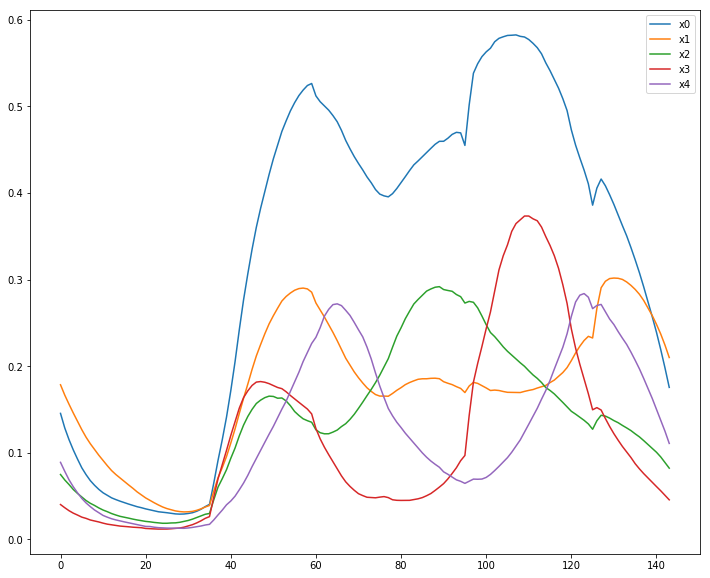

In [110]:
x_corr = np.abs(t.iloc[:, 1:].values)
max_corr = x_corr.max(axis=1)

group=x.mean(axis=1)*0
group[x_corr[:, 0]==max_corr] = 0
group[x_corr[:, 1]==max_corr] = 1
group[x_corr[:, 2]==max_corr] = 2
group[x_corr[:, 3]==max_corr] = 3
group[x_corr[:, 4]==max_corr] = 4

idgrp = pd.concat([data_bj[['driver_id', 'city_id']],
                   pd.Series(group, index=data_bj.index)], axis=1)
idgrp.columns = ['driver_id', 'city_id','group_id']

x0 = x[group==0, :].mean(axis=0)
x1 = x[group==1, :].mean(axis=0)
x2 = x[group==2, :].mean(axis=0)
x3 = x[group==3, :].mean(axis=0)
x4 = x[group==4, :].mean(axis=0)
                   
plt.figure(figsize=(12, 10))

plt.subplot(111)
plt.plot(x0[:144], label='x0')
plt.plot(x1[:144], label='x1')
plt.plot(x2[:144], label='x2')
plt.plot(x3[:144], label='x3')
plt.plot(x4[:144], label='x4')

plt.legend()

plt.show()

In [111]:
donut_chart(idgrp,'group_id')

In [113]:
group_nums = idgrp.groupby('group_id').count().reset_index().cumsum()
group_nums

,group_id,driver_id,city_id
0,0.0,49361.0,49361.0
1,1.0,109487.0,109487.0
2,3.0,139795.0,139795.0
3,6.0,163020.0,163020.0
4,10.0,176883.0,176883.0


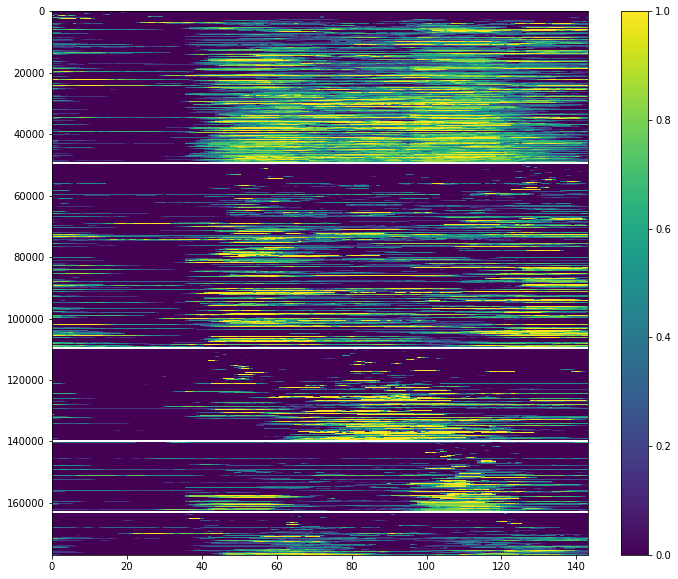

In [114]:
idx3 = np.argsort(group + max_corr)
plt.figure(figsize=(12, 10))
plt.imshow(x[idx3, :], aspect='auto')
plt.hlines(y=int(group_nums['driver_id'][0])-1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][0]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][0])+1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]+1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]+1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][3]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][3]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][3]+1), xmin=0, xmax=144,color='white')
plt.xlim(0,143)
plt.colorbar()
plt.show()

# K-means clustering

#### 采用无监督学习把所有司机按照与v矩阵前5个因子的相关性聚类，结果被最终采用

In [115]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

In [130]:
x_train = t.iloc[:, 1:].values
kmeans = KMeans(n_clusters=5, random_state=100).fit(x_train)
kmeans_group_out = kmeans.labels_

In [131]:
kmeans_group_out

array([2, 2, 2, ..., 4, 3, 3], dtype=int32)

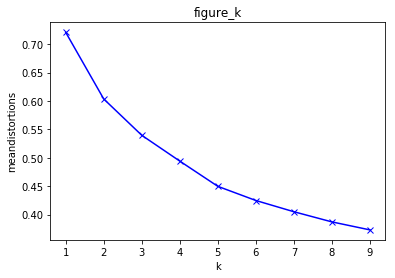

In [124]:
K = range(1,10)
meandistortions = []

for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(x_train)
    meandistortions.append(sum(np.min(cdist(x_train,
                                           kmeans.cluster_centers_,
                                           'euclidean'), axis=1))/x_train.shape[0])
plt.plot(K, meandistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('meandistortions')
plt.title('figure_k')
plt.show()

In [137]:
data_out = pd.concat([data_bj[['driver_id', 'city_id']],
                     pd.Series(kmeans_group_out, index=data_bj.index)], axis=1)
data_out.columns = ['driver_id', 'city_id', 'group_id']
data_out.groupby('group_id').count()['driver_id']/data_out.groupby('group_id').count()['driver_id'].sum()

group_id
0    0.148714
1    0.236891
2    0.179882
3    0.214995
4    0.219518
Name: driver_id, dtype: float64

In [128]:
donut_chart(data_out, 'group_id')

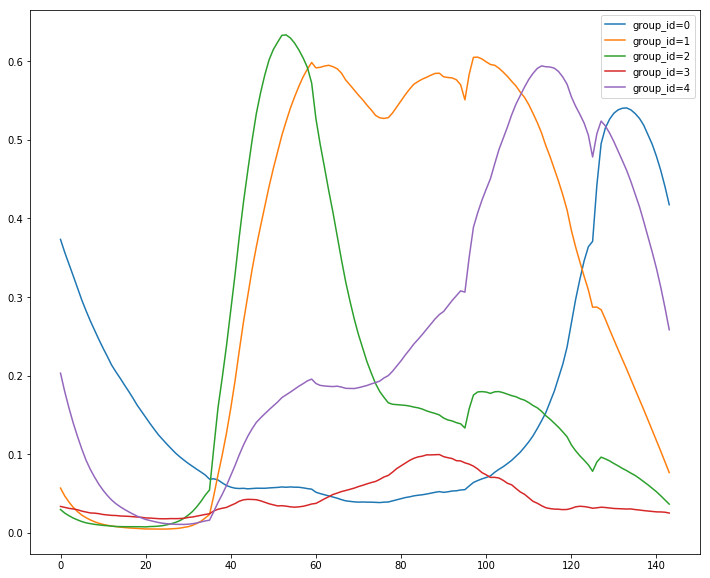

In [134]:
x0 = x[kmeans_group_out==0, :].mean(axis=0)
x1 = x[kmeans_group_out==1, :].mean(axis=0)
x2 = x[kmeans_group_out==2, :].mean(axis=0)
x3 = x[kmeans_group_out==3, :].mean(axis=0)
x4 = x[kmeans_group_out==4, :].mean(axis=0)

plt.figure(figsize=(12,10))

plt.subplot(111)
plt.plot(x0[:144], label='group_id=0')
plt.plot(x1[:144], label='group_id=1')
plt.plot(x2[:144], label='group_id=2')
plt.plot(x3[:144], label='group_id=3')
plt.plot(x4[:144], label='group_id=4')
plt.legend()

plt.show()

In [135]:
group_nums = data_out.groupby('group_id').count().reset_index().cumsum()
group_nums

,group_id,driver_id,city_id
0,0,26305,26305
1,1,68207,68207
2,3,100025,100025
3,6,138054,138054
4,10,176883,176883


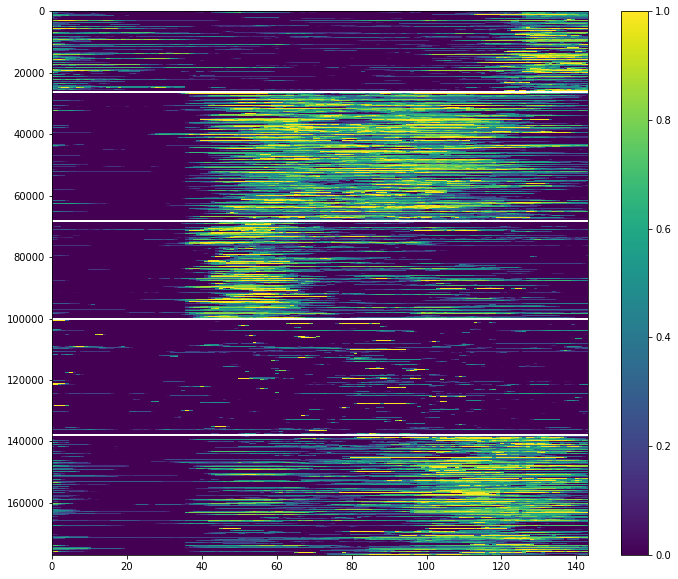

In [151]:
idx4 = np.argsort(kmeans_group_out)
plt.figure(figsize=(12, 10))
plt.imshow(x[idx4, :], aspect='auto')
plt.hlines(y=int(group_nums['driver_id'][0])-1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][0]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][0])+1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][1]+1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][2]+1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][3]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][3]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums['driver_id'][3]+1), xmin=0, xmax=144,color='white')
plt.xlim(0,143)
plt.colorbar()
plt.show()

### 重新分配group_id调整各组顺序使他们看起来区分度更高

In [159]:
group_id_mapping = {0:3, 1:4, 2:1, 3:0, 4:2}

In [163]:
kmeans_group_out_new = pd.DataFrame(kmeans_group_out)[0].map(group_id_mapping)

In [167]:
kmeans_group_out_new = np.array(kmeans_group_out_new)
kmeans_group_out_new

array([1, 1, 1, ..., 2, 0, 0])

In [169]:
data_out['group_id_sorted'] = data_out['group_id'].map(group_id_mapping)

In [170]:
group_nums_sorted = data_out.groupby('group_id_sorted').count().reset_index().cumsum()
group_nums_sorted

,group_id_sorted,driver_id,city_id,group_id
0,0,38029,38029,38029
1,1,69847,69847,69847
2,3,108676,108676,108676
3,6,134981,134981,134981
4,10,176883,176883,176883


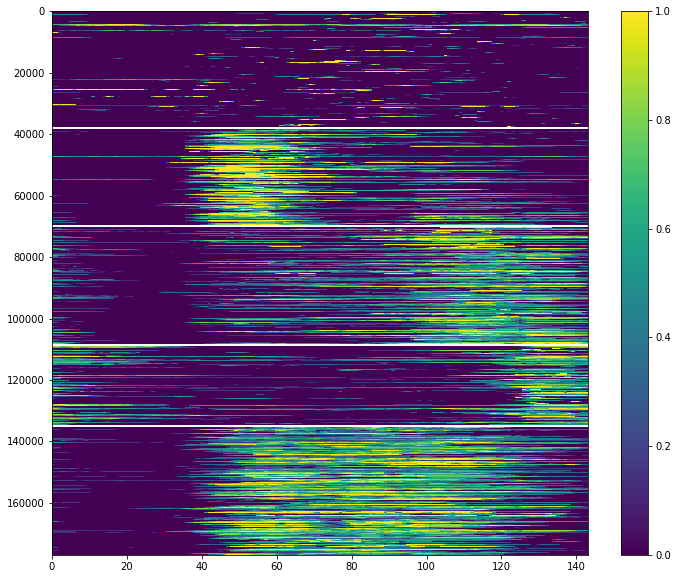

In [171]:
idx4 = np.argsort(kmeans_group_out_new)
plt.figure(figsize=(12, 10))
plt.imshow(x[idx4, :], aspect='auto')
plt.hlines(y=int(group_nums_sorted['driver_id'][0])-1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][0]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][0])+1, xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][1]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][1]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][1]+1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][2]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][2]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][2]+1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][3]-1), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][3]), xmin=0, xmax=144,color='white')
plt.hlines(y=int(group_nums_sorted['driver_id'][3]+1), xmin=0, xmax=144,color='white')
plt.xlim(0,143)
plt.colorbar()
plt.show()